# GlobalStreetscapes - Street View Imagery
We aggregate the semantic, perception, and view-index layers from GlobalStreetscapes into the canonical 30 m grid (and optionally 60/90 m for MAUP sensitivity).

## Overview
- **Segmentation (Building/Road/Sidewalk/Vegetation/Sky/Water)** capture surface sealing vs. shade/evapotranspiration.
- **Perception scores (Beautiful/Safe, etc.)** proxy subjective comfort and urban form.
- **View indices (green/sky)** reflect canopy cover and radiative exposure, key UHI drivers.


## 1. Setup and Configuration

In [ ]:
import pandas as pd
import numpy as np
from pathlib import Path
import geopandas as gpd
import gc
from shapely.geometry import Point
import matplotlib.pyplot as plt
import contextily as ctx
import ipywidgets as widgets
from IPython.display import display, clear_output
from tqdm.auto import tqdm
import sys

PROJECT_ROOT = Path('..').resolve()
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

FIG_DIR = PROJECT_ROOT / 'results' / 'figures'
FIG_DIR.mkdir(parents=True, exist_ok=True)
    

## 1. Setup and City Selection
We focus on six European cities (Amsterdam, Athens, Barcelona, Berlin, Madrid, Paris) because they span two Köppen climates (Cfb, Csa) and have dense street imagery coverage.


In [28]:
# Configuration
CITIES = ['Amsterdam', 'Athens', 'Barcelona', 'Berlin', 'Madrid', 'Paris']
DATA_DIR = Path('../data/0-raw/GlobalStreetscapes')
DATA_FILE = DATA_DIR / 'globalstreetscapes.parquet'
DATA_DIR.mkdir(parents=True, exist_ok=True)
OUTPUT_DIR = Path('../data/1-processed/GlobalStreetscapes')
GRID_ROOT = Path('../data/utils/grids')
GRID_RESOLUTIONS = [30, 60, 90]
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

In [29]:

def prepare_city_streetscapes(city, streetscapes_df):
    """Filter rows for a single city and ensure coordinates exist."""
    city_streetscapes = streetscapes_df[streetscapes_df['city'] == city].copy()
    if city_streetscapes.empty:
        print(f"  No streetscape data for {city}")
        return None
    city_streetscapes = city_streetscapes.dropna(subset=['lat', 'lon'])
    if city_streetscapes.empty:
        print(f"  No valid coordinates for {city}")
        return None
    return city_streetscapes


def perform_streetscape_joins(city_grid, streetscapes_gdf):
    joined = gpd.sjoin(
        city_grid[['global_grid_id', 'geometry']],
        streetscapes_gdf,
        predicate='intersects'
    )
    print(f"  Spatial join: {len(joined):,} matches")
    return joined


def aggregate_streetscape_features(joined_data, feature_config):
    if joined_data.empty:
        return pd.DataFrame(index=[])

    semantic_features = feature_config.get('semantic', [])
    if 'Total' in joined_data.columns and semantic_features:
        for feature in semantic_features:
            if feature != 'Total' and feature in joined_data.columns:
                joined_data[f'{feature}_proportion'] = (
                    joined_data[feature] / joined_data['Total'].clip(lower=1)
                )

    agg_dict = {'uuid': 'count'}
    for feature in semantic_features:
        if feature != 'Total' and feature in joined_data.columns:
            agg_dict[f'{feature}_proportion'] = 'mean'
    for cat in ['perception', 'view_indices']:
        for f in feature_config.get(cat, []):
            if f in joined_data.columns:
                agg_dict[f] = 'mean'

    aggregated = joined_data.groupby('global_grid_id').agg(agg_dict)
    new_cols = ['image_count']
    for col in aggregated.columns[1:]:
        if '_proportion' in col:
            new_cols.append(col.replace('_proportion', '_mean'))
        else:
            new_cols.append(f"{col}_mean")
    aggregated.columns = new_cols
    return aggregated



## 2. City Selection

European cities were selected based on climate diversity and data availability in GlobalStreetscapes.

In [30]:
cities_df = pd.read_csv('https://huggingface.co/datasets/NUS-UAL/global-streetscapes/resolve/main/cities688.csv')

selected_columns = ['city', 'img_count', 'continent', 'koppen_geiger_zone', 'zone_description']
selected_cities = ['Amsterdam', 'Athens', 'Barcelona', 'Berlin', 'Madrid', 'Paris']

cities_table = cities_df[
    (cities_df['city'].isin(selected_cities)) & 
    ((cities_df['city'] != 'Madrid') | (cities_df['continent'] == 'Europe'))
][selected_columns].sort_values('city', ascending=True)

cities_table

,city,img_count,continent,koppen_geiger_zone,zone_description
221,Amsterdam,26421,Europe,Cfb,"Marine west coast, warm summer"
396,Athens,106003,Europe,Csa,"Mediterranean, hot summer"
508,Barcelona,21218,Europe,Csa,"Mediterranean, hot summer"
456,Berlin,281033,Europe,Cfb,"Marine west coast, warm summer"
339,Madrid,16124,Europe,Csa,"Mediterranean, hot summer"
176,Paris,14113,Europe,Cfb,"Marine west coast, warm summer"


### Datasets in huggingface where we are getting the data from
- `streetscapes.parquet`: core semantic / perception metrics per image.
- `climate.parquet`, `season.parquet`, `ephem.parquet`: environmental context (temperature, sun angle, season).
- `places365.parquet`, `ghsl.parquet`, `h3.parquet`: land-use descriptors and spatial identifiers.
The merged dataframe is cached locally (`data/0-raw/GlobalStreetscapes`) to avoid repeated downloads.

In [31]:
# Short interactive file explorer for info.csv and explore files and its description
info_df = pd.read_csv('https://huggingface.co/datasets/NUS-UAL/global-streetscapes/resolve/main/info.csv').drop_duplicates().ffill()

dropdown = widgets.Dropdown(
    options=['All Files'] + sorted(info_df['Filename'].dropna().unique()),
    value='climate.csv', description='Select file:', layout=widgets.Layout(width='250px')
)
out = widgets.Output(layout=widgets.Layout(overflow_y='auto'))

def show_info(change=None):
    with out:
        clear_output(wait=True)
        df = info_df if dropdown.value == 'All Files' else info_df[info_df['Filename'] == dropdown.value]
        df = df[['Filename', 'Overview', 'Notes']].dropna(subset=['Filename']).drop_duplicates()
        if not df.empty:
            display(df.style.set_properties(subset=['Notes'], **{'white-space': 'pre-wrap', 'max-width': '400px'}))
        else:
            print("No matching files found.")

dropdown.observe(show_info, names='value')
display(widgets.VBox([dropdown, out]))
show_info()

### 3.2 Interactive Feature Explorer
We can also explore the features in the every file for easier exploration of the data.

In [32]:
# to explore the columns features from different files
info_df = pd.read_csv('https://huggingface.co/datasets/NUS-UAL/global-streetscapes/resolve/main/info.csv').ffill()

file_dropdown = widgets.Dropdown(
    options=['All Files'] + info_df['Filename'].dropna().unique().tolist(),
    value='climate.csv', description='Select file:', layout={'width': '300px'}
)
field_search = widgets.Text(placeholder='Search fields...', description='Filter:', layout={'width': '300px'})
output = widgets.Output(layout=widgets.Layout(overflow_y='auto'))

def update_display(change=None):
    with output:
        clear_output(wait=True)
        df = info_df.copy()
        if file_dropdown.value != 'All Files':
            df = df[df['Filename'] == file_dropdown.value]
        if field_search.value.strip():
            df = df[df['Field'].str.contains(field_search.value, case=False, na=False)]
        if not df.empty:
            display(df[['Filename', 'Field', 'Format', 'Explanation']].style.set_properties(
                subset=['Explanation'], **{'overflow': 'auto'}
            ))
        else:
            print("No matching fields found.")

file_dropdown.observe(update_display, names='value')
field_search.observe(update_display, names='value')
display(widgets.HBox([file_dropdown, field_search]), output)
update_display()

Output()

## 4. Data Acquisition
We extract the data directly from  [Global StreetScapes huggingface dataset](https://huggingface.co/datasets/NUS-UAL/global-streetscapes)
### 4.1 Feature Loading and Integration

Extract and merge relevant features from multiple GlobalStreetscapes files for our selected European cities.

In [33]:
def load_base_streetscapes():
    """Load base streetscapes data from HuggingFace dataset"""
    print("Loading base streetscapes data...")
    ds = load_dataset("NUS-UAL/global-streetscapes", data_files="data/parquet/streetscapes.parquet")
    df = pd.concat([s.to_pandas() for s in ds.values()], ignore_index=True)

    # Filter to our cities and European continent
    df = df[df['city'].isin(CITIES) & (df['continent'] == 'Europe')].copy()
    print(f"  Filtered to {len(df):,} images from {len(CITIES)} European cities")

    return df

We use cache to avoid downloading the data every time we run the notebook.

In [34]:
if not DATA_FILE.exists():
    base_df = load_base_streetscapes()
    print(f"Base dataset: {len(base_df):,} images from {base_df['city'].nunique()} cities")
    print(f"Cities: {sorted(base_df['city'].unique())}")
    print(f"Base features: {base_df.shape[1]}")
else:
    print("Using cached data - skipping base loading test")

Using cached data - skipping base loading test


In [35]:
def add_additional_features(base_df):
    """Add features from additional GlobalStreetscapes files"""
    print("Adding features from additional files...")
    df = base_df.copy()
    uuids = set(df['uuid'])

    additional_files = ['climate', 'season', 'ephem', 'h3', 'places365', 'ghsl']

    for file_name in additional_files:
        print(f"  Adding features from {file_name}.parquet...")
        ds_path = f"data/parquet/{file_name}.parquet"

        try:
            ds_add = load_dataset("NUS-UAL/global-streetscapes", data_files=ds_path)
            df_add = pd.concat([s.to_pandas() for s in ds_add.values()], ignore_index=True)
            df_add = df_add[df_add['uuid'].isin(uuids)]

            # Get new columns (exclude uuid which is the join key)
            new_cols = [c for c in df_add.columns if c not in df.columns and c != 'uuid']

            if new_cols:
                df = df.merge(df_add[['uuid'] + new_cols], on='uuid', how='left')
                print(f"    Added {len(new_cols)} features")
            else:
                print(f"    No new features found")

        except Exception as e:
            print(f"    Failed to load {file_name}: {str(e)}")

    return df

In [36]:
if not DATA_FILE.exists():
    enhanced_df = add_additional_features(base_df)
    print(f"Enhanced dataset: {enhanced_df.shape[1]} features (was {base_df.shape[1]})")
    print(f"Features added: {enhanced_df.shape[1] - base_df.shape[1]}")
    feature_samples = list(enhanced_df.columns[-10:])  # Show last 10 features
    print(f"Sample new features: {feature_samples}")
else:
    print("Using cached data - skipping additional features test")

Using cached data - skipping additional features test


## 2. Data download and caching
We reuse the cached GlobalStreetscapes parquet when available and only fetch from HuggingFace when the local file is missing.


In [37]:
def load_or_build_streetscapes():
    if DATA_FILE.exists():
        print(f"Loading cached data from {DATA_FILE.name}...")
        return pd.read_parquet(DATA_FILE)

    print("Processing data from source...")
    base_df = load_base_streetscapes()
    enhanced_df = add_additional_features(base_df)
    enhanced_df.to_parquet(DATA_FILE, index=False)
    print(f"Cached processed data to {DATA_FILE}")
    return enhanced_df


df = load_or_build_streetscapes()
print(f"Dataset ready: {len(df):,} images, {df.shape[1]} features across {df['city'].nunique()} cities")



Loading cached data from globalstreetscapes.parquet...
Dataset ready: 458,583 images, 164 features across 6 cities


In [38]:
if DATA_FILE.exists():
    print("Loading cached data...")
    df = pd.read_parquet(DATA_FILE)
else:
    print("Processing data from source...")
    # Step 1: Load base streetscapes
    base_df = load_base_streetscapes()

    # Step 2: Add additional features
    enhanced_df = add_additional_features(base_df)

    # Step 3: Cache for future use
    cache_processed_data(enhanced_df)
    df = enhanced_df

Loading cached data...


In [39]:
print(f"\nDataset ready: {df.shape[0]:,} images, {df.shape[1]} features across {len(df['city'].unique())} cities")
print("\nAll features:")
for i, col in enumerate(df.columns, 1):
    print(f"{i:3d}. {col}")


Dataset ready: 458,583 images, 164 features across 6 cities

All features:
  1. uuid
  2. source
  3. orig_id
  4. glare
  5. lighting_condition
  6. pano_status
  7. platform
  8. quality
  9. reflection
 10. view_direction
 11. weather
 12. lat
 13. lon
 14. datetime_local
 15. year
 16. month
 17. day
 18. hour
 19. width
 20. height
 21. heading
 22. projection_type
 23. hFoV
 24. vFoV
 25. sequence_index
 26. sequence_id
 27. sequence_img_count
 28. Bird
 29. Ground-Animal
 30. Curb
 31. Fence
 32. Guard-Rail
 33. Barrier
 34. Wall
 35. Bike-Lane
 36. Crosswalk---Plain
 37. Curb-Cut
 38. Parking
 39. Pedestrian-Area
 40. Rail-Track
 41. Road
 42. Service-Lane
 43. Sidewalk
 44. Bridge
 45. Building
 46. Tunnel
 47. Person
 48. Bicyclist
 49. Motorcyclist
 50. Other-Rider
 51. Lane-Marking---Crosswalk
 52. Lane-Marking---General
 53. Mountain
 54. Sand
 55. Sky
 56. Snow
 57. Terrain
 58. Vegetation
 59. Water
 60. Banner
 61. Bench
 62. Bike-Rack
 63. Billboard
 64. Catch-Basin
 

### 4.2 Spatial Distribution

Visualise spatial coverage of streetscape data using dual basemaps (dark + satellite)

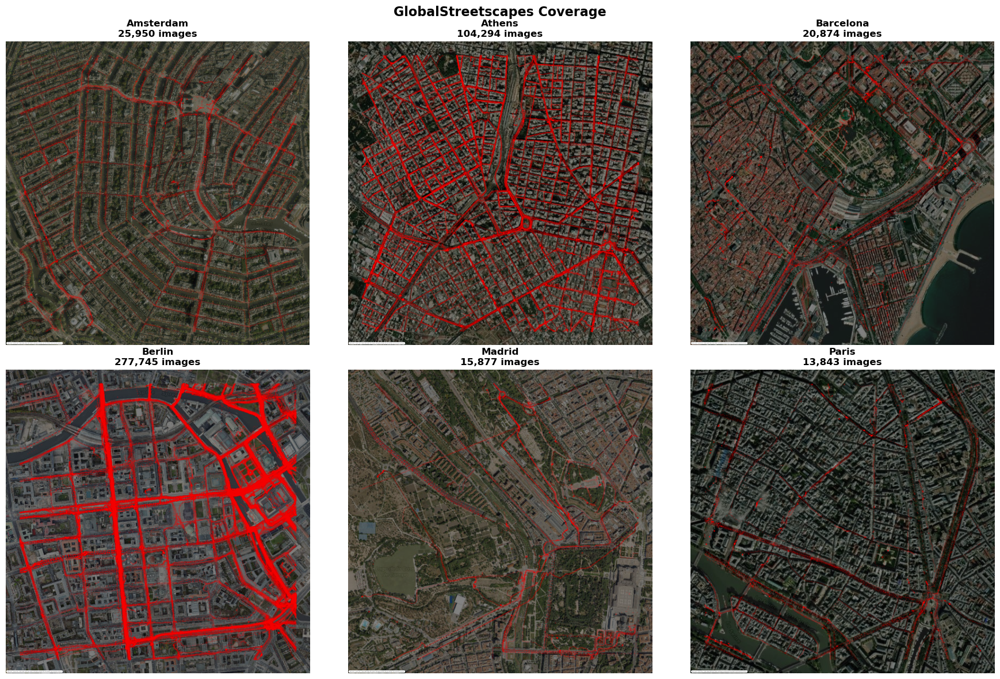

Saved figure to /Users/gerardoezequiel/Developer/ShapingCoolCities/results/figures/streetview_points_panels.png


In [41]:
geometry = [Point(xy) for xy in zip(df['lon'], df['lat'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry, crs='EPSG:4326')

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for i, city in enumerate(CITIES):
    ax = axes[i]
    city_gdf = gdf[gdf['city'] == city].copy()
    if len(city_gdf) > 0:
        # Convert to Web Mercator for basemap
        city_gdf = city_gdf.to_crs('EPSG:3857')
        # Plot points
        city_gdf.plot(ax=ax, color='red', markersize=0.4, alpha=0.1)
        # Add dark basemap
        ctx.add_basemap(
            ax,
            source=ctx.providers.CartoDB.DarkMatter,
            crs=city_gdf.crs,
            attribution_size=1
        )
        # Add satellite basemap at 0.5 opacity
        ctx.add_basemap(
            ax,
            source=ctx.providers.Esri.WorldImagery,
            crs=city_gdf.crs,
            alpha=0.5,
            attribution_size=1
        )
        ax.set_title(f'{city}\n{len(city_gdf):,} images', fontsize=12, fontweight='bold')
        ax.set_axis_off()
    else:
        ax.text(0.5, 0.5, f'No data for {city}', ha='center', va='center', transform=ax.transAxes)
        ax.set_title(city, fontsize=12, fontweight='bold')
        ax.set_axis_off()

plt.suptitle('GlobalStreetscapes Coverage', fontsize=16, fontweight='bold')
plt.tight_layout()
fig_path = FIG_DIR / 'streetview_points_panels.png'
plt.savefig(fig_path, dpi=300, bbox_inches='tight')
plt.show()
print(f'Saved figure to {fig_path}')



## 5. UHI Feature Selection

Selection features relevant for UHI modeling. We focus on three main categories:
- **Semantic features**: Urban surface types (Building, Road, Vegetation, etc.)
- **Perception features**: Crowd-sourced ratings (Beautiful, Safe, Lively, etc.)  
- **View indices**: Computed metrics (Green View Index, Sky View Index)

Define features relevant for UHI modeling

## 3. Why these features matter for UHI
- **Building/Road/Sidewalk:** proxy imperviousness and surface sealing.
- **Vegetation + green view:** capture shading and evapotranspiration.
- **Sky view:** indicates radiative trapping vs. openness.
- **Perception scores:** correlate with perceived safety/comfort, often mirroring built form.


In [42]:
UHI_FEATURES = {
    'semantic': ['Building', 'Road', 'Sidewalk', 'Vegetation', 'Sky', 'Water', 'Total'],
    'perception': ['Beautiful', 'Safe', 'Wealthy', 'Lively', 'Boring', 'Depressing'], 
    'view_indices': ['green_view_index', 'sky_view_index'],
    'metadata': ['uuid', 'lat', 'lon', 'city', 'year']
}

print("Feature Availability Check:")
print("=" * 40)

all_features = []
for category, features in UHI_FEATURES.items():
    available = [f for f in features if f in df.columns]
    print(f"{category.capitalize():12}: {len(available)} available")
    if len(available) < len(features):
        missing = [f for f in features if f not in df.columns]
        print(f"              Missing: {missing}")
    all_features.extend(available)

streetscapes_filtered = df[all_features].copy()

print(f"\nDataset filtered: {df.shape[1]} -> {len(streetscapes_filtered.columns)} features")
print(f"\nData Quality Summary:")
print(f"  Total images: {len(streetscapes_filtered):,}")
print(f"  Missing data: {streetscapes_filtered.isnull().sum().sum():,} values")

Feature Availability Check:
Semantic    : 7 available
Perception  : 6 available
View_indices: 2 available
Metadata    : 5 available

Dataset filtered: 164 -> 20 features

Data Quality Summary:
  Total images: 458,583
  Missing data: 0 values


## 6. Grid Integration and export

Spatially integrate streetscape features into standardised  grid cells.

Using spatial joins to match point-based streetscape data to grid cells, then aggregating features using mean values for continuous variables and counts for image density.

In [43]:
def perform_streetscape_joins(city_demo_grid, streetscapes_gdf):
    """Perform spatial joins between demo_grid cells and streetscape points"""
    # Spatial join: demo_grid cells to streetscape points
    joined = gpd.sjoin(
        city_demo_grid[['global_grid_id', 'geometry']],
        streetscapes_gdf,
        predicate='intersects'
    )

    images_count = len(streetscapes_gdf)
    matches_count = len(joined)
    print(f"  Spatial join: {matches_count:,} matches from {images_count:,} images")

    return joined

In [44]:
def aggregate_streetscape_features(joined_data, feature_config):
    """Aggregate streetscape features within grid cells"""
    if joined_data.empty:
        return pd.DataFrame(index=[])

    # For semantic features, calculate proportions first
    semantic_features = feature_config.get('semantic', [])
    if 'Total' in joined_data.columns and semantic_features:
        for feature in semantic_features:
            if feature != 'Total' and feature in joined_data.columns:
                # Create proportion column by dividing by Total (avoid division by zero)
                joined_data[f'{feature}_proportion'] = (
                    joined_data[feature] / joined_data['Total'].clip(lower=1)
                )

    # Build aggregation dictionary
    agg_dict = {'uuid': 'count'}

    # Add semantic proportions (use proportions instead of raw counts)
    for feature in semantic_features:
        if feature != 'Total' and feature in joined_data.columns:
            agg_dict[f'{feature}_proportion'] = 'mean'

    # Add perception and view indices features as before
    for cat in ['perception', 'view_indices']:
        for f in feature_config.get(cat, []):
            if f in joined_data.columns:
                agg_dict[f] = 'mean'

    # Aggregate by grid cell
    aggregated = joined_data.groupby('global_grid_id').agg(agg_dict)

    # Rename columns: image_count + semantic proportions + other features
    new_cols = ['image_count']
    for col in aggregated.columns[1:]:
        if '_proportion' in col:
            # Semantic proportions: Building_proportion -> Building_mean
            new_cols.append(col.replace('_proportion', '_mean'))
        else:
            # Other features get _mean suffix
            new_cols.append(f"{col}_mean")

    aggregated.columns = new_cols

    return aggregated

## 4. City integration pipeline
Each city is processed by filtering valid coordinates, spatially joining points to the canonical grid, and aggregating semantic/perception/view features per cell.


In [45]:
def integrate_city_streetscapes(city, demo_grid, streetscapes_df, feature_config):
    """Process one city: prepare data, spatial join, aggregate, merge back."""
    print(f"Processing {city}...")
    city_grid = demo_grid[demo_grid['city'] == city].copy()
    city_data = prepare_city_streetscapes(city, streetscapes_df)
    if city_data is None:
        semantic_features = feature_config.get('semantic', [])
        for feature in semantic_features:
            if feature != 'Total':
                city_grid[f'{feature}_mean'] = 0.0
        for cat in ['perception', 'view_indices']:
            for feature in feature_config.get(cat, []):
                city_grid[f'{feature}_mean'] = 0.0
        city_grid['image_count'] = 0
        city_grid['has_streetscape_data'] = False
        return city_grid

    streetscapes_gdf = gpd.GeoDataFrame(
        city_data,
        geometry=gpd.points_from_xy(city_data['lon'], city_data['lat']),
        crs='EPSG:4326'
    ).to_crs(demo_grid.crs)

    joined = perform_streetscape_joins(city_grid, streetscapes_gdf)
    aggregated = aggregate_streetscape_features(joined, feature_config)
    result = city_grid.merge(aggregated, left_on='global_grid_id', right_index=True, how='left').fillna(0)
    result['has_streetscape_data'] = result['image_count'] > 0
    coverage = result['has_streetscape_data'].sum()
    coverage_pct = 100 * coverage / len(result)
    print(f"  Coverage: {coverage:,}/{len(result):,} cells ({coverage_pct:.1f}%)")
    return result

## 5. Multi-resolution exports
We always produce the 30 m grid for modelling; 60/90 m exports exist solely to support the MAUP sensitivity notebook.


In [46]:
resolution_results = {}
reference_resolution = GRID_RESOLUTIONS[0]

for grid_size in GRID_RESOLUTIONS:
    print(f"=== Integrating GlobalStreetscapes for {grid_size} m grid ===")
    grid_path = GRID_ROOT / f"all_cities_{grid_size}m_grid.parquet"
    if not grid_path.exists():
        print(f"  Grid file missing: {grid_path}")
        continue

    grid = gpd.read_parquet(grid_path)
    print(f"  Grid loaded: {len(grid):,} cells")

    city_results = []
    for city in CITIES:
        city_result = integrate_city_streetscapes(city, grid, streetscapes_filtered, UHI_FEATURES)
        if city_result is not None and not city_result.empty:
            city_results.append(city_result)
        gc.collect()

    grid_integrated = (
        pd.concat(city_results, ignore_index=True)
        if city_results else pd.DataFrame(columns=list(grid.columns) + list(UHI_FEATURES.keys()))
    )
    if city_results:
        grid_integrated = gpd.GeoDataFrame(grid_integrated, geometry='geometry', crs=grid.crs)
    else:
        grid_integrated = gpd.GeoDataFrame(grid_integrated)

    resolution_results[grid_size] = grid_integrated

    coverage = grid_integrated['has_streetscape_data'].sum() if 'has_streetscape_data' in grid_integrated else 0
    total_cells = len(grid_integrated)
    pct = 100 * coverage / total_cells if total_cells else 0
    print(f"  Cells with data: {coverage:,}/{total_cells:,} ({pct:.1f}%)")

    export_path = OUTPUT_DIR / f'GlobalStreetscapes_grid_{grid_size}m.parquet'
    grid_integrated.to_parquet(export_path, index=False)
    print(f"  Exported to {export_path}")

reference_grid = resolution_results.get(reference_resolution)

=== Integrating GlobalStreetscapes for 30 m grid ===
  Grid loaded: 40,344 cells
Processing Amsterdam...
  Spatial join: 25,903 matches from 25,950 images
  Coverage: 3,405/6,724 cells (50.6%)
Processing Athens...
  Spatial join: 103,067 matches from 104,294 images
  Coverage: 4,755/6,724 cells (70.7%)
Processing Barcelona...
  Spatial join: 20,597 matches from 20,874 images
  Coverage: 2,531/6,724 cells (37.6%)
Processing Berlin...
  Spatial join: 277,434 matches from 277,745 images
  Coverage: 4,189/6,724 cells (62.3%)
Processing Madrid...
  Spatial join: 15,793 matches from 15,877 images
  Coverage: 1,936/6,724 cells (28.8%)
Processing Paris...
  Spatial join: 13,807 matches from 13,843 images
  Coverage: 2,043/6,724 cells (30.4%)
  Cells with data: 18,859/40,344 (46.7%)
  Exported to ../data/1-processed/GlobalStreetscapes/GlobalStreetscapes_grid_30m.parquet
=== Integrating GlobalStreetscapes for 60 m grid ===
  Grid loaded: 10,086 cells
Processing Amsterdam...
  Spatial join: 25,90

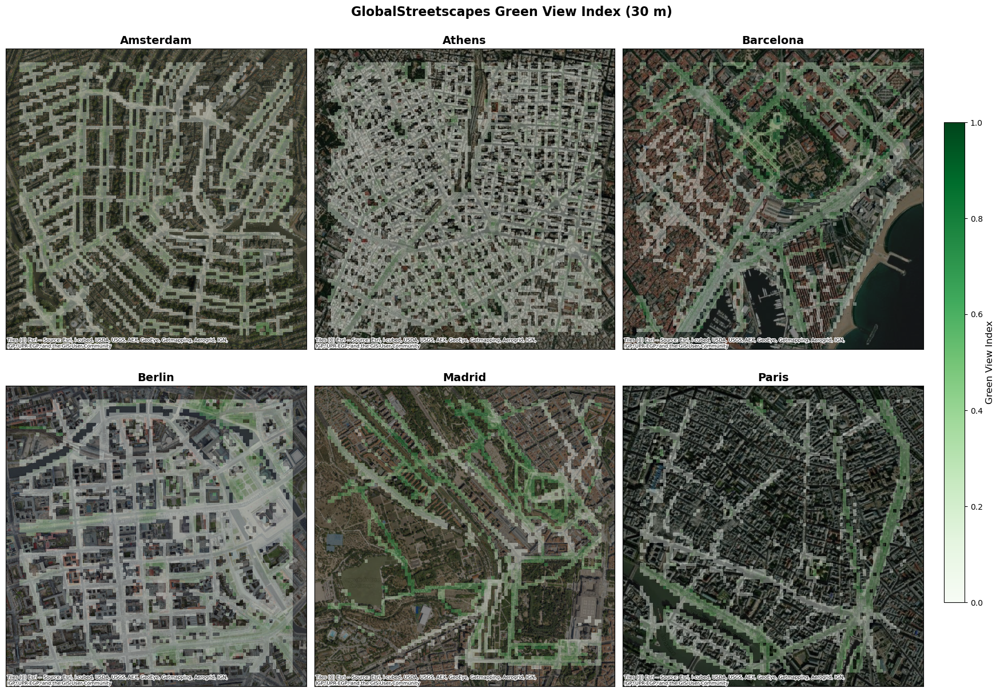

In [47]:
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()
mappable = None

for i, city in enumerate(CITIES):
    ax = axes[i]
    city_grid = reference_grid[reference_grid['city'] == city].copy()

    if len(city_grid) > 0:
        city_grid = city_grid.to_crs('EPSG:3857')
        if 'green_view_index_mean' in city_grid.columns:
            # Create alpha values: 0 for zero values, 0.4 for non-zero values
            alpha_values = np.where(city_grid['green_view_index_mean'] == 0, 0, 0.4)
            mappable = city_grid.plot(
                column='green_view_index_mean',
                ax=ax,
                cmap='Greens',
                legend=False,
                edgecolor='none',
                vmin=0, vmax=1,
                alpha=alpha_values
            )
        try:
            ctx.add_basemap(ax, source=ctx.providers.CartoDB.DarkMatter, crs=city_grid.crs, attribution_size=6)
            ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery, crs=city_grid.crs, alpha=0.5, attribution_size=6)
        except Exception:
            pass
        ax.set_title(f"{city}", fontsize=14, fontweight='bold')
        ax.set_xticks([])
        ax.set_yticks([])
    else:
        ax.text(0.5, 0.5, f'No data for {city}', ha='center', va='center', transform=ax.transAxes)
        ax.set_title(f"{city}", fontsize=14, fontweight='bold')

plt.tight_layout()
plt.suptitle(f'GlobalStreetscapes Green View Index ({reference_resolution} m)', fontsize=16, fontweight='bold', y=1.02)

if mappable is not None:
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    sm = plt.cm.ScalarMappable(cmap='Greens', norm=plt.Normalize(vmin=0, vmax=1))
    sm._A = []
    fig.colorbar(sm, cax=cbar_ax).set_label("Green View Index", fontsize=12)
plt.subplots_adjust(right=0.9)
fig_path = FIG_DIR / 'green_view_index_panels.png'
plt.savefig(fig_path, dpi=300, bbox_inches='tight')
plt.show()
print(f'Saved figure to {fig_path}')




In [48]:
for grid_size, grid_integrated in resolution_results.items():
    if grid_integrated is None or grid_integrated.empty:
        print(f"Resolution {grid_size} m: no data exported.")
        continue
    total = len(grid_integrated)
    coverage = grid_integrated['has_streetscape_data'].sum() if 'has_streetscape_data' in grid_integrated else 0
    pct = 100 * coverage / total if total else 0
    print(f"Resolution {grid_size} m: {coverage:,}/{total:,} cells with data ({pct:.1f}%)")
print("Exports stored in ../data/1-processed/GlobalStreetscapes with resolution suffixes.")


Resolution 30 m: 18,859/40,344 cells with data (46.7%)
Resolution 60 m: 6,910/10,086 cells with data (68.5%)
Resolution 90 m: 3,719/4,704 cells with data (79.1%)
Exports stored in ../data/1-processed/GlobalStreetscapes with resolution suffixes.
